In [17]:
%load_ext autoreload
%autoreload 2

In [18]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PowerTransformer, RobustScaler, QuantileTransformer
from sklearn.cluster import HDBSCAN
import matplotlib.pyplot as plt

from src.analysis.get_pca_config import get_pca_config
from src.analysis.cluster_data import cluster_data

In [19]:
plt.style.use("dark_background")

In [20]:
# set seed for reproducibility
seed = 123

In [21]:
audio_df = pd.read_csv('./data/df_audio_features_5000.csv', index_col=0)
audio_df.head()

,name,artist,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,duration_ms,time_signature,id,html
0,Se Eu Quiser Falar Com Deus ...,Gilberto Gil,0.658,0.2590,11,-13.141,0,0.0705,0.694,0.000059,0.975,0.306,110.376,,256213,4,1n7JnwviZ7zf0LR1tcGFq7,https://open.spotify.com/track/1n7JnwviZ7zf0LR...
1,Saudade De Bahia ...,Antônio Carlos Jobim,0.742,0.3990,2,-12.646,1,0.0346,0.217,0.000002,0.107,0.693,125.039,,191867,4,5QGM1U0eCYrQuwSJwTm5Zq,https://open.spotify.com/track/5QGM1U0eCYrQuwS...
2,"Canta Canta, Minha Gente ...",Martinho Da Vila,0.851,0.7300,2,-11.048,1,0.3470,0.453,0.000063,0.124,0.905,93.698,,152267,4,0NLIFSZxPzQhCwnkn5PJYs,https://open.spotify.com/track/0NLIFSZxPzQhCwn...
3,Mulher Eu Sei ...,Chico César,0.705,0.0502,4,-18.115,1,0.0471,0.879,0.000041,0.386,0.524,106.802,,186227,4,3mXqOdlLE1k67WsAxryPFs,https://open.spotify.com/track/3mXqOdlLE1k67Ws...
4,Rosa Morena ...,Kurt Elling,0.651,0.1190,6,-19.807,1,0.0380,0.916,0.000343,0.104,0.402,120.941,,273680,4,7bSzjzjTkWT2CkIPPdp0eA,https://open.spotify.com/track/7bSzjzjTkWT2CkI...


Two columns, id and html we don't need for our analysis. Furthermore the .csv was probably saved with index on resulting in "unnamed: 0" column.
Let's start with cleaning the columns

In [22]:
# check column naming
audio_df.columns

Index(['name                                                                                                                                                                             ',
       'artist                                          ', 'danceability ',
       'energy   ', 'key ', 'loudness ', 'mode ', 'speechiness ',
       'acousticness ', 'instrumentalness ', 'liveness ', 'valence ',
       'tempo   ', 'type ', 'duration_ms ', 'time_signature ',
       'id                     ', 'html'],
      dtype='object')

## data cleaning
The column names contain many whitespaces that should be removed before we can drop any columns

In [23]:
# clean up column names
audio_df.columns = audio_df.columns.str.replace(' ', '')
audio_df.columns

Index(['name', 'artist', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'type', 'duration_ms', 'time_signature', 'id',
       'html'],
      dtype='object')

In [24]:
# drop weird first column and other unneeded columns
audio_df = audio_df.drop(columns=['type', 'id', 'html'])
audio_df

,name,artist,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,Se Eu Quiser Falar Com Deus ...,Gilberto Gil,0.6580,0.25900,11,-13.141,0,0.0705,0.694,0.000059,0.9750,0.3060,110.376,256213,4
1,Saudade De Bahia ...,Antônio Carlos Jobim,0.7420,0.39900,2,-12.646,1,0.0346,0.217,0.000002,0.1070,0.6930,125.039,191867,4
2,"Canta Canta, Minha Gente ...",Martinho Da Vila,0.8510,0.73000,2,-11.048,1,0.3470,0.453,0.000063,0.1240,0.9050,93.698,152267,4
3,Mulher Eu Sei ...,Chico César,0.7050,0.05020,4,-18.115,1,0.0471,0.879,0.000041,0.3860,0.5240,106.802,186227,4
4,Rosa Morena ...,Kurt Elling,0.6510,0.11900,6,-19.807,1,0.0380,0.916,0.000343,0.1040,0.4020,120.941,273680,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5230,"1812 Festival Overture, Op. 49: 1812 Overture,...",Pyotr Ilyich Tchaikovsky,0.2020,0.06940,3,-23.390,1,0.0473,0.917,0.715000,0.0832,0.0655,87.906,995000,4
5231,"Winter Fragments pour ensemble instrumental, s...",Tristan Murail,0.1880,0.10100,6,-21.873,1,0.0442,0.855,0.426000,0.0694,0.0355,83.134,855000,4
5232,"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3...",Arnold Schoenberg,0.0596,0.00093,9,-42.959,1,0.0434,0.951,0.969000,0.0772,0.0344,71.573,238187,3
5233,"Serenade For Strings In E, Op.22, B. 52: 1. Mo...",Antonín Dvořák,0.1330,0.02080,4,-29.443,1,0.0419,0.883,0.505000,0.1110,0.0591,67.109,314307,4


In [25]:
# check for duplicates
print(f"Number of duplicated rows in the data is: {audio_df.duplicated().sum()}")

Number of duplicated rows in the data is: 71


In [26]:
# remove duplicates
audio_df.drop_duplicates(inplace=True)
print(f"Number of duplicated rows in the data is after cleaning: {audio_df.duplicated().sum()}")

Number of duplicated rows in the data is after cleaning: 0


In [27]:
# check for empty values
audio_df.isnull().sum()

name                0
artist              0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
dtype: int64

In [28]:
audio_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5164 entries, 0 to 5234
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              5164 non-null   object 
 1   artist            5164 non-null   object 
 2   danceability      5164 non-null   float64
 3   energy            5164 non-null   float64
 4   key               5164 non-null   int64  
 5   loudness          5164 non-null   float64
 6   mode              5164 non-null   int64  
 7   speechiness       5164 non-null   float64
 8   acousticness      5164 non-null   float64
 9   instrumentalness  5164 non-null   float64
 10  liveness          5164 non-null   float64
 11  valence           5164 non-null   float64
 12  tempo             5164 non-null   float64
 13  duration_ms       5164 non-null   int64  
 14  time_signature    5164 non-null   int64  
dtypes: float64(9), int64(4), object(2)
memory usage: 645.5+ KB


## Data preparations

In [29]:
# set indices
audio_df.set_index(['name', 'artist'], inplace=True)
audio_df.head()

,,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
name,artist,,,,,,,,,,,,,
Se Eu Quiser Falar Com Deus,Gilberto Gil,0.658,0.2590,11,-13.141,0,0.0705,0.694,0.000059,0.975,0.306,110.376,256213,4
Saudade De Bahia,Antônio Carlos Jobim,0.742,0.3990,2,-12.646,1,0.0346,0.217,0.000002,0.107,0.693,125.039,191867,4
"Canta Canta, Minha Gente",Martinho Da Vila,0.851,0.7300,2,-11.048,1,0.3470,0.453,0.000063,0.124,0.905,93.698,152267,4
Mulher Eu Sei,Chico César,0.705,0.0502,4,-18.115,1,0.0471,0.879,0.000041,0.386,0.524,106.802,186227,4
Rosa Morena,Kurt Elling,0.651,0.1190,6,-19.807,1,0.0380,0.916,0.000343,0.104,0.402,120.941,273680,4


Further consideration of column to be dropped
duration_ms and time_signature

In [30]:
# drop duration_ms
audio_df.drop(['duration_ms'], inplace=True)

In [31]:
# set scaler
scalers = [
    StandardScaler(),
    MinMaxScaler(),
    RobustScaler(),
    QuantileTransformer(n_quantiles=audio_df.shape[0]),
    PowerTransformer(),
]
scaler_names = [
    'standard scaler',
    'minmax scaler',
    'robust scaler',
    'quantile scaler',
    'power scaler',
]

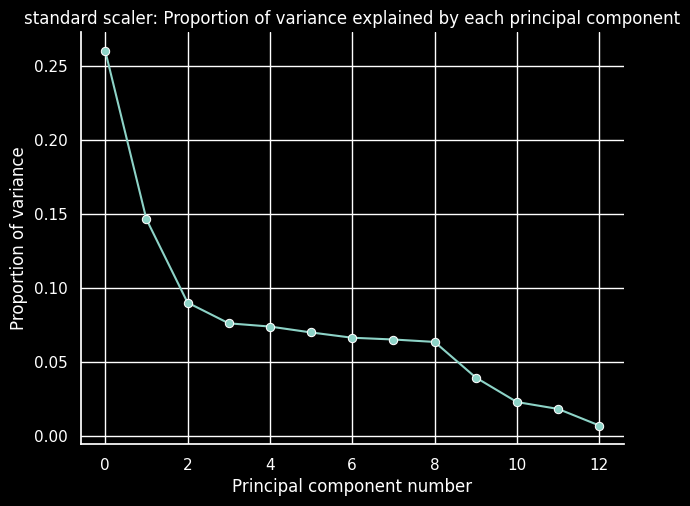

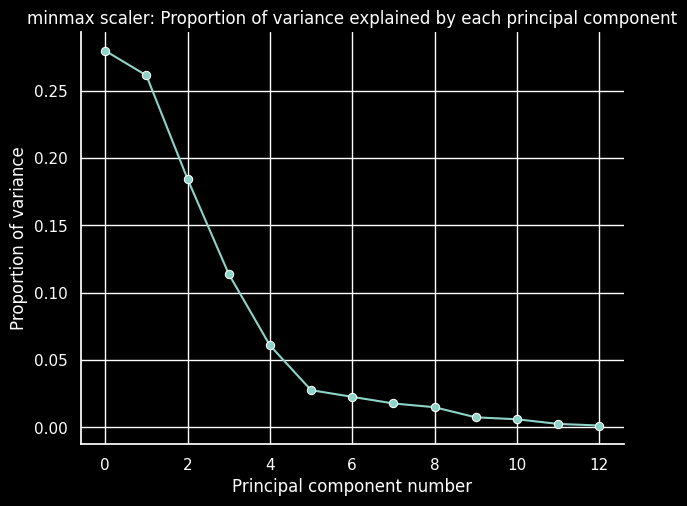

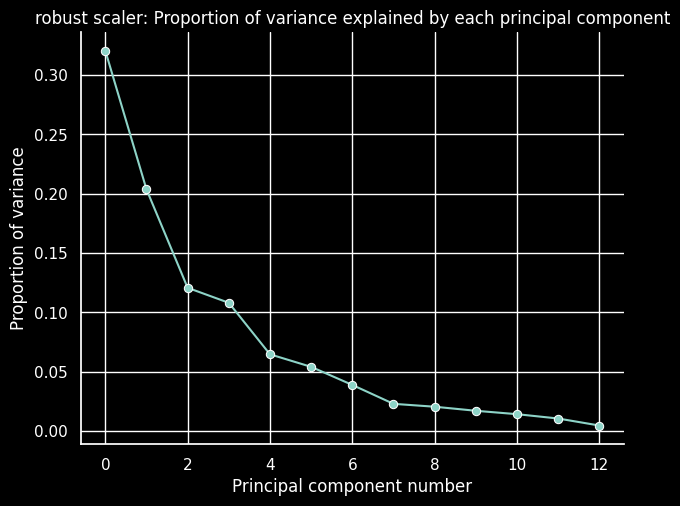

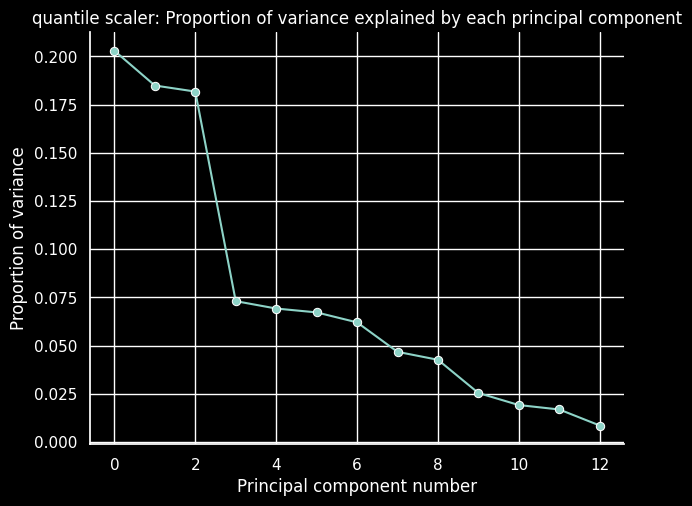

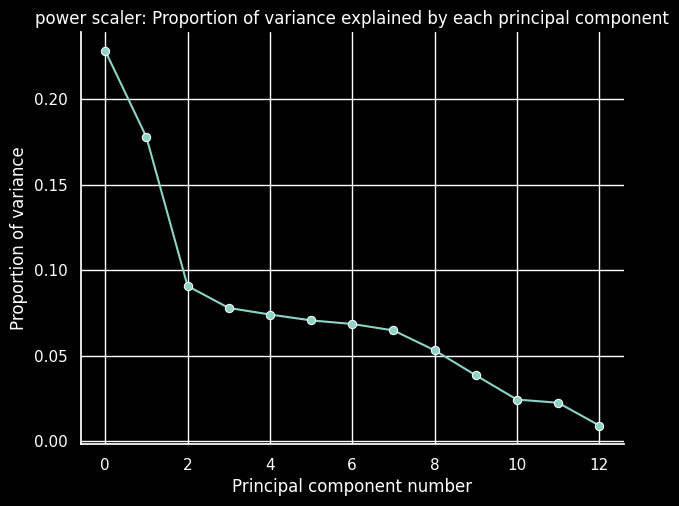

In [32]:
# get pca components for different scalers
for scaler_name, scaler in zip(scaler_names, scalers):
    get_pca_config(
        df=audio_df,
        scaler_name=scaler_name,
        scaler=scaler,
        normalize=False,
    )

In [33]:
# set global parameters
pca = True  # use pca
pca_components = [3, 5, 7, 3, 10]

for (
    scaler_name,
    scaler,
    pca_component,
) in zip(scaler_names, scalers, pca_components):
    _ = cluster_data(
        df=audio_df,
        scaler_name=scaler_name,
        scaler=scaler,
        cluster_alg=HDBSCAN(store_centers='centroid', min_cluster_size=10, max_cluster_size=300),
        normalize=False,
        pca=pca,
        pca_comp=pca_component,
        verbose=True,
    )

# normalize

In [ ]:
# get pca components for different scalers
for scaler_name, scaler in zip(scaler_names, scalers):
    get_pca_config(
        df=audio_df,
        scaler_name=scaler_name,
        scaler=scaler,
        normalize=True,
    )

In [35]:
pca = True  # use pca
pca_components = [8, 5, 7, 3, 4]

for scaler_name, scaler, pca_component in zip(scaler_names, scalers, pca_components):
    _ = cluster_data(
        df=audio_df,
        scaler_name=scaler_name,
        scaler=scaler,
        cluster_alg=HDBSCAN(store_centers='centroid', min_cluster_size=10, max_cluster_size=200),
        normalize=True,
        pca=pca,
        pca_comp=pca_component,
        verbose=True,
    )